# Filecoin Baseline Crossing Data & Model

Notebook for data analytics and simulations regarding Filecoin Baseline Function & associated metrics like rewards and share of the world storage


Authors:
- Danilo Lessa Bernardineli (danilo@block.science)
- Gabriel Lefundes (gabriel@block.science)

In [1]:
%load_ext autotime
%load_ext autoreload
%autoreload 2

time: 19.3 ms (started: 2021-08-12 10:20:23 -04:00)


In [2]:
# External dependences
import pandas as pd
import numpy as np
import plotly.express as px
from prophet import Prophet
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go


# Move path to parent folder
import sys
sys.path.insert(1, '../')

import plotly
plotly.offline.init_notebook_mode()

time: 2.57 s (started: 2021-08-12 10:20:23 -04:00)


## Data Analytics

In [3]:
NETWORK_LAUNCH = '2020-08-24 22:00+00:00'
MAINNET_LAUNCH = '2020-10-15 14:44+00:00'
BASELINE_CROSSING = '2021-04-02 05:00+00'

FIL_ISSUANCE = 2 * 1e9 # FIL
FIL_BASE = 0.55 * FIL_ISSUANCE # FIL
SIMPLE_FRACTION = 0.3
SIMPLE_ISSUANCE = SIMPLE_FRACTION * FIL_BASE
BASELINE_ISSUANCE = (1 - SIMPLE_FRACTION) * FIL_BASE

time: 24.1 ms (started: 2021-08-12 10:20:26 -04:00)


In [4]:
# Create a connection object from a conn string
from filecoin_metrics.connection import get_connection, get_connection_string
conn_string = get_connection_string('../config/sentinel-conn-string.txt')
connection = get_connection(conn_string)

time: 914 ms (started: 2021-08-12 10:20:26 -04:00)


In [5]:
QUERY = f"""
select
	date_trunc('HOUR', to_timestamp(height_to_unix(cr.height))) as timestamp,
	date_trunc('HOUR', to_timestamp(height_to_unix(avg(cr.effective_network_time)::int8))) as effective_network_time,
	avg(cr.new_baseline_power::numeric / 1024^5) as baseline_power, /* PiB */
	avg(cp.total_raw_bytes_power::numeric / 1024^5) as raw_bytes_network_power, /* PiB */
	avg(cr.total_mined_reward::numeric / 1e18) as total_mined_reward /* FIL */
FROM chain_rewards cr
join chain_powers cp on cp.height = cr.height
where cr.height > 148888 /* Mainnet Launch Block Height */
group by timestamp
"""

query_df = (pd.read_sql(QUERY, connection))

time: 3.59 s (started: 2021-08-12 10:20:27 -04:00)


In [6]:
df = (query_df.copy())
df.head()


,timestamp,effective_network_time,baseline_power,raw_bytes_network_power,total_mined_reward
0,2020-11-30 22:00:00+00:00,2020-09-13 22:00:00+00:00,3090.809303,1179.310208,1.441779e+07
1,2021-07-17 03:00:00+00:00,2021-04-26 02:00:00+00:00,4767.434178,7708.443977,8.693093e+07
2,2020-10-19 03:00:00+00:00,2020-08-31 01:00:00+00:00,2849.576442,594.952266,7.242257e+06
3,2020-11-06 03:00:00+00:00,2020-09-04 17:00:00+00:00,2948.666302,786.673123,9.960794e+06
4,2020-11-11 14:00:00+00:00,2020-09-06 11:00:00+00:00,2979.389606,862.596347,1.086607e+07


time: 51.4 ms (started: 2021-08-12 10:20:30 -04:00)


In [7]:
fig = px.line(df,
              x='timestamp',
              y=['baseline_power', 'raw_bytes_network_power'],
              title='Baseline Power (PiB) vs RB Network Power (PiB)',
              labels={'value': 'RB Storage Power (PiB)',
                      'timestamp': 'Timestamp'})

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text='Baseline Crossing')

# fig.add_vrect(NETWORK_LAUNCH, 
#               MAINNET_LAUNCH, 
#               fillcolor='green', 
#               opacity=0.15)

fig.show()

time: 1.4 s (started: 2021-08-12 10:20:30 -04:00)


In [8]:
crossing_ind = np.argmin(np.abs(df.baseline_power - df.raw_bytes_network_power))
print(f"Baseline crossed at {df.iloc[crossing_ind].timestamp}")

Baseline crossed at 2021-04-02 05:00:00+00:00
time: 35.6 ms (started: 2021-08-12 10:20:32 -04:00)


In [9]:
y = (df.timestamp - df.effective_network_time).dt.days
fig = px.line(df,
              x='timestamp',
              y=y,
              title='Discrepancy Between Effective Network Time and Real Time',
              labels={'y': 'Difference in Days from Effective Network Time'})


fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text='Baseline Crossing')


# fig.add_vrect(NETWORK_LAUNCH, 
#               MAINNET_LAUNCH, 
#               fillcolor='green', 
#               opacity=0.15)

fig.show()

time: 266 ms (started: 2021-08-12 10:20:32 -04:00)


In [10]:
def rewards(t,
            t_0,
            issuance):
    dt_seconds = (t - t_0).total_seconds()
    dt = dt_seconds / (60 * 60 * 24 * 365.25) # Years
    lamb = np.log(2) / 6
    rewards = issuance * (1 - np.exp(-lamb * dt))
    return rewards

f = lambda x: rewards(x, pd.Timestamp(NETWORK_LAUNCH), SIMPLE_ISSUANCE)
g = lambda x: rewards(x, pd.Timestamp(NETWORK_LAUNCH), BASELINE_ISSUANCE)
h = lambda df: df.simple_rewards + df.baseline_rewards
k = lambda df: df.total_mined_reward - df.expected_rewards
df = (df.assign(simple_rewards=df.timestamp.map(f),
                baseline_rewards=df.effective_network_time.map(g))
        .assign(expected_rewards=h)
        .assign(rewards_error=k)
        .assign(simple_fraction=lambda df: df.simple_rewards / df.expected_rewards,
                baseline_fraction=lambda df: df.baseline_rewards / df.expected_rewards)
        .assign(hourly_simple_rewards=lambda df: df.simple_rewards.diff(),
                hourly_baseline_rewards=lambda df: df.baseline_rewards.diff())
     )

time: 46.2 ms (started: 2021-08-12 10:20:32 -04:00)


In [11]:
fig = px.line(df,
              x='timestamp',
              y=['simple_rewards', 'baseline_rewards'],
              title='Total Rewards over Time according to Minting Function')

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text='Baseline Crossing')


# fig.add_vrect(NETWORK_LAUNCH, 
#               MAINNET_LAUNCH, 
#               fillcolor='green', 
#               opacity=0.15)
print("Total distributed rewards")
print(f"Simple: {df.simple_rewards.max() :.3g} FIL")
print(f"Baseline: {df.baseline_rewards.max() :.3g} FIL")
print(f"Total: {df.expected_rewards.max() :.3g} FIL")

fig.show()

Total distributed rewards
Simple: 3.48e+07 FIL
Baseline: 6.41e+07 FIL
Total: 9.89e+07 FIL


time: 542 ms (started: 2021-08-12 10:20:32 -04:00)


In [12]:
fig = px.line(df,
              x='timestamp',
              y=['simple_fraction', 'baseline_fraction'],
              title='Total Rewards over Time according to Minting Function (relative)')

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text='Baseline Crossing')


# fig.add_vrect(NETWORK_LAUNCH, 
#               MAINNET_LAUNCH, 
#               fillcolor='green', 
#               opacity=0.15)
fig.add_hline(0.3, annotation_text='Long-Term Expected Simple Issuance Fraction')
fig.show()

time: 589 ms (started: 2021-08-12 10:20:32 -04:00)


## Modelling

On the following block, we'll build a cadCAD model for the Filecoin Minting Function

In [13]:
import numpy as np

SIMULATION_YEARS = 6
TIMESTEPS_PER_YEAR = 365
N_t = SIMULATION_YEARS * TIMESTEPS_PER_YEAR


## Logic

def years_passed(p, s, h, v, p_i):
    timesteps = v['timestep']
    years_per_timestep = p['years_per_timestep']
    return ('years_passed', timesteps * years_per_timestep)


def network_power(p, s, h, v, p_i):
    t = v['timestep']
    value = p['network_power_signal'][t]
    return ('network_power', value)


def baseline_function(p, s, h, v, p_i):
    b = (1 + p['baseline_growth_rate'])
    b **= v['years_passed']
    b *= p['initial_baseline']
    return ('baseline_function', b)


def cummulative_baseline_function(p, s, h, v, p_i):
    dt = p['years_per_timestep']
    value = min(v['network_power'], v['baseline_function']) * dt
    value += v['cummulative_baseline_function']
    return ('cummulative_baseline_function', value)


def effective_years_passed(p, s, h, v, p_i):
    g = np.log(1 + p['baseline_growth_rate'])
    
    R_sigma = v['cummulative_baseline_function']
    
    theta = np.log(1 + g * R_sigma / p['initial_baseline']) / g
    
    return ('effective_years_passed', theta)


def simple_block_reward(p, s, h, v, p_i):
    t = v['years_passed']
    value = p['simple_issuance'] * (1 - np.exp(-p['halving_rate'] * t))
    return ('simple_block_reward', value)


def baseline_block_reward(p, s, h, v, p_i):
    t = v['effective_years_passed']
    value = p['baseline_issuance'] * (1 - np.exp(-p['halving_rate'] * t))
    return ('baseline_block_reward', value)


def block_reward(p, s, h, v, p_i):
    value = v['baseline_block_reward'] + v['simple_block_reward']
    return ('block_reward', value)

## Structure

partial_state_update_blocks = [
    {
        'policies': {
            
        },
        'variables': {
            'years_passed': years_passed
        }
    },
    {
        'policies': {
            
        }, 
        'variables': {
            'baseline_function': baseline_function,
            'network_power': network_power
        }
        
    },
    {
        'policies': {
            
        },
        'variables': {
            'cummulative_baseline_function': cummulative_baseline_function
        }
    },
    {
        'policies': {
            
        },
        'variables': {
            'effective_years_passed': effective_years_passed
        }
    },
    {
    'policies': {

    },
    'variables': {
        'simple_block_reward': simple_block_reward,
        'baseline_block_reward': baseline_block_reward,
    }
},
        {
    'policies': {

    },
    'variables': {
        'block_reward': block_reward
    }
}
]

time: 39 ms (started: 2021-08-12 10:20:33 -04:00)


In [14]:
START_NP = 500
END_NP = 10000

NP_1 = np.linspace(START_NP, END_NP, int(2 * N_t / 10))
NP_2 = END_NP * np.ones(int(8 * N_t / 10) + 1)
NP = np.concatenate([NP_1, NP_2])

time: 30.6 ms (started: 2021-08-12 10:20:33 -04:00)


In [15]:
## Params


HALVING_PERIOD = 6 # Years

# N_t: number of timesteps
params = {
    
    # Input Signals
    'network_power_signal': [NP], # PiB
    
    # Parameters
    'initial_baseline': [2888], # PiB
    'baseline_growth_rate': [1.0], # Percent per year
    'simple_issuance': [0.3], # FIL
    'baseline_issuance': [0.7], # FIL
    'halving_rate': [np.log(2) / HALVING_PERIOD], # Years
    
    # Unit conversion
    'years_per_timestep': [1 / TIMESTEPS_PER_YEAR],
    
}

## Initial Conditions

initial_conditions = {
    'years_passed': 0,
    'network_power': None,
    'baseline_function': None,
    'cummulative_baseline_function': 0,
    'effective_years_passed': 0,
    'simple_block_reward': 0,
    'baseline_block_reward': 0,
    'block_reward': 0
}

time: 30.2 ms (started: 2021-08-12 10:20:33 -04:00)


In [16]:
%%capture
from cadCAD_tools import easy_run

sim_df = easy_run(initial_conditions,
              params,
              partial_state_update_blocks,
              N_t,
              1,
              assign_params=True,
              drop_substeps=True)

time: 791 ms (started: 2021-08-12 10:20:33 -04:00)


In [17]:
sim_df.head(5)

,years_passed,network_power,baseline_function,cummulative_baseline_function,effective_years_passed,simple_block_reward,baseline_block_reward,block_reward,simulation,subset,run,timestep,network_power_signal,initial_baseline,baseline_growth_rate,simple_issuance,baseline_issuance,halving_rate,years_per_timestep
0,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,1,0,500.000000,2888,1.0,0.3,0.7,0.115525,0.00274
6,0.000000,521.739130,2888.000000,1.429422,0.000495,0.000000,0.000040,0.000040,0,0,1,1,521.739130,2888,1.0,0.3,0.7,0.115525,0.00274
12,0.002740,543.478261,2893.489619,2.918404,0.001010,0.000095,0.000082,0.000177,0,0,1,2,543.478261,2888,1.0,0.3,0.7,0.115525,0.00274
18,0.005479,565.217391,2898.989673,4.466945,0.001546,0.000190,0.000125,0.000315,0,0,1,3,565.217391,2888,1.0,0.3,0.7,0.115525,0.00274
24,0.008219,586.956522,2904.500182,6.075045,0.002102,0.000285,0.000170,0.000455,0,0,1,4,586.956522,2888,1.0,0.3,0.7,0.115525,0.00274


time: 51.4 ms (started: 2021-08-12 10:20:34 -04:00)


In [18]:
fig_df = sim_df.query('years_passed < 2.5 & years_passed > 0.0')

x = fig_df.years_passed

fig = make_subplots(rows=1, 
                    cols=3,
                    shared_xaxes=True,
                    x_title='Years Passed Since Mainnet',
                    subplot_titles=['Network Power vs Baseline Function',
                                    'Instantaneous Share of Baseline Rewards',
                                    'Effective Network Time Lag'])

fig.add_trace(
    go.Scatter(x=x,
               y=fig_df.network_power,
               name='RB Network Power (PiB)'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=x,
               y=fig_df.baseline_function,
               name='Baseline Function (PiB)'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=x,
               y=fig_df.baseline_block_reward.diff() / fig_df.block_reward.diff(),
               name='Baseline Reward Fraction'),
    row=1, col=2
)


fig.add_trace(
    go.Scatter(x=x,
               y=fig_df.years_passed - fig_df.effective_years_passed,
               name='Lag (Years)'),
    row=1, col=3
)

# Plot Baseline Crossings

# Find roots
from scipy import interpolate
from scipy.optimize import fsolve

x = fig_df.years_passed
y = fig_df.baseline_function - fig_df.network_power
f = f = interpolate.interp1d(x, y)
roots = fsolve(f, [0.1, 2.1])

# Visualize Baseline Crossings lines
for root in roots:
    fig.add_vline(root, 
                  line_color='green',
                  annotation_text='Baseline Crossing',
                  annotation_textangle=-90,
                  annotation_yanchor='top')


fig.update_layout(title_text="Behaviour When Crossing Baseline Funtion",
                  width=1600,
                  height=600)
fig.show()

time: 386 ms (started: 2021-08-12 10:20:34 -04:00)


In [19]:
T_0 = pd.Timestamp(MAINNET_LAUNCH)
f = lambda df: T_0 + df.years_passed.map(lambda x: pd.Timedelta(x * 365.25, unit='day'))

sim_df = sim_df.assign(timestamp=f)

time: 54.3 ms (started: 2021-08-12 10:20:34 -04:00)


In [20]:
fig = px.line(sim_df,
              x='timestamp',
              y=sim_df.baseline_function / 1024,
              title='Projected Baseline Function for the next 6 years',
              labels={'y': 'Storage in EiB'})

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text="Baseline Crossing")
fig.show()

time: 153 ms (started: 2021-08-12 10:20:35 -04:00)


In [21]:
ZiB = 1024 ** 2

cols = ('timestamp', 'data_sphere_size', 'core_store_fraction')

DATA_SPHERE_RECORDS = [
    ('2020-07-01 00:00+00:00', 50 * ZiB, 0.28),
    ('2021-07-01 00:00+00:00', 65 * ZiB, 0.33),
    ('2022-07-01 00:00+00:00', 80 * ZiB, 0.38),
    ('2023-07-01 00:00+00:00', 102 * ZiB, 0.42),
    ('2024-07-01 00:00+00:00', 130 * ZiB, 0.45),
    ('2025-07-01 00:00+00:00', 175 * ZiB, 0.48),
    ('2026-07-01 00:00+00:00', 190 * ZiB, 0.50)
]

ds_df = (pd.DataFrame.from_records(DATA_SPHERE_RECORDS, columns=cols)
           .assign(core_store_size=lambda df: df.data_sphere_size * df.core_store_fraction))

time: 37.9 ms (started: 2021-08-12 10:20:35 -04:00)


In [22]:
z_df = (pd.concat([ds_df, sim_df])
          .assign(timestamp=lambda df: pd.to_datetime(df.timestamp, utc=True))
          .sort_values('timestamp')
          .assign(core_store_size=lambda df: df.core_store_size.interpolate())
          .assign(baseline_vs_world=lambda df: df.baseline_function / df.core_store_size))

time: 46.2 ms (started: 2021-08-12 10:20:35 -04:00)


In [23]:
px.line(z_df,
           x='timestamp',
           y=['core_store_size', 'baseline_function'],
           labels={'value': 'PiB'},
           log_y=True)

time: 221 ms (started: 2021-08-12 10:20:35 -04:00)


In [24]:
fig = px.line(z_df,
              x='timestamp',
              y='baseline_vs_world',
              title='Baseline Function Growth in terms of the Projected World Storage (Public Cloud)',
              labels={'baseline_vs_world': 'Baseline as fraction of the World Storage'})

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text="Baseline Crossing")
              
fig.layout.yaxis.tickformat = ',.2%'
fig.show()

time: 151 ms (started: 2021-08-12 10:20:35 -04:00)


In [25]:
WORLD_MAX_CAPACITY = 50000

proj_df = (df.resample('1d', on='timestamp')
             .mean()
             .reset_index()
             .assign(ds=lambda df: df.timestamp.dt.tz_localize(None))
             .assign(y=lambda df: df.raw_bytes_network_power)
             .assign(cap=WORLD_MAX_CAPACITY))

m = Prophet(growth = 'logistic')
m.fit(proj_df)
future = m.make_future_dataframe(periods=180)
future['cap'] = WORLD_MAX_CAPACITY
forecast = m.predict(future)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


time: 3.44 s (started: 2021-08-12 10:20:35 -04:00)


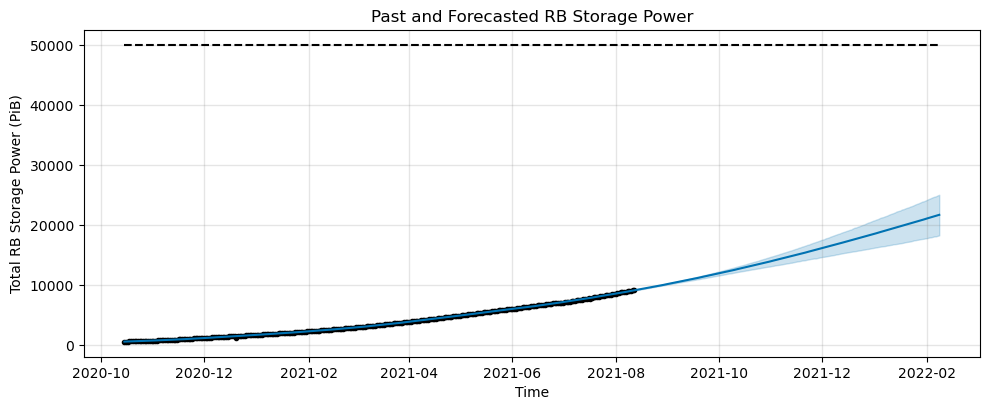

time: 261 ms (started: 2021-08-12 10:20:39 -04:00)


In [26]:
fig = m.plot(forecast, figsize=(10, 4))
plt.title('Past and Forecasted RB Storage Power')
plt.xlabel("Time")
plt.ylabel("Total RB Storage Power (PiB)")
plt.show()

In [27]:
f = lambda df: df.ds

f_df = pd.concat([forecast.assign(timestamp=f), z_df])

time: 45.1 ms (started: 2021-08-12 10:20:39 -04:00)


In [28]:
x = forecast.ds
x_rev = x[::-1]
y = forecast.yhat
y_upper = forecast.yhat_upper
y_lower = forecast.yhat_lower
y_lower_rev = y_lower[::-1]


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, 
    y=y,
    line_color='rgb(0,176,246)',
    name='RB Network Power',
))

fig.add_trace(go.Scatter(
    x=pd.concat([x, x_rev]),
    y=pd.concat([y_upper, y_lower_rev]),
    fill='toself',
    name='RB Network Power (uncertainty)',
    fillcolor='rgba(0,176,246,0.2)',
    line_color='rgba(255,255,255,0)',
))

fig.add_trace(go.Scatter(
    x=z_df.timestamp, 
    y=z_df.baseline_function,
    name='Baseline Function',
    line_color='coral',
))
fig.update_layout(title='Projection of RB Network Power vs Baseline Function',
                    yaxis_title='Storage (PiB)',
                    xaxis_title='Timestamp')
fig.update_traces(mode='lines')
fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text="Baseline Crossing")
fig.show()

time: 149 ms (started: 2021-08-12 10:20:39 -04:00)


In [29]:
theta = lambda t: np.log(2 ** t + 1) - 1

t = np.linspace(0, 10, 100)
dt = 0.01
y = (theta(t + dt) - theta(t)) / dt
px.line(x=t,
        y=y,
        title="Effective Network Power as Fraction of Real Time (RB-NP = 50% Baseline)",
        labels={'x': 'Years Passed',
                'y': 'Fraction of Real Time'})

time: 78.8 ms (started: 2021-08-12 10:20:39 -04:00)


In [30]:
## Use forecast for the Network power to predict Simple and Baseline rewards for the next six months ##

# Defining some constants 
g = np.log(2) # g (see documentation)
b0 = 2830.558283572499 # Initial baseline
ys = 60 * 60 * 24 * 365.25 # Year in seconds
lamb = np.log(2)/6 # lambda (see documentation) 

# Baseline function (input is a timestep)
def baseline(x):
    dt_seconds = (x - forecast.ds[0]).total_seconds()
    dt = dt_seconds/ys # Years
    return b0*np.exp(g*dt)

forecast["baseline"] = forecast.ds.map(baseline) # Baseline for each timestep
forecast["cumNP"] = forecast[["baseline","trend"]].min(axis=1).cumsum() # Cumulative capped network power

# Effective time from cumulative capped network power
def theta(cumnp):
    return 365.25/g*np.log(1+g*cumnp/(b0*365.25))

# Effective time for each timestep
forecast["eff_time"] = forecast["cumNP"].map(theta)

# Reward function (note the same function is used for both simple and baseline rewards)
def rewards(dt_seconds, issuance):
    dt = dt_seconds/ys # Years
    rewards = issuance * (1 - np.exp(-lamb * dt))
    return rewards

simple_reward = lambda x: rewards((x - forecast.ds[0]).total_seconds(), SIMPLE_ISSUANCE)
baseline_reward = lambda x: rewards(x*60*60*24, BASELINE_ISSUANCE)

forecast["simple_rewards"] = forecast.ds.map(simple_reward) # Simple rewards
forecast["baseline_rewards"] = forecast.eff_time.map(baseline_reward) # Baseline rewards



time: 62.6 ms (started: 2021-08-12 10:20:39 -04:00)


In [31]:
## Create visualization of 'Projection of total rewards over time' ##

fig = px.line(forecast,
              x='ds',
              y=['simple_rewards', 'baseline_rewards'],
              title='Projection of Total Rewards over Time (FIL)')

fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text="Baseline Crossing")
              
fig.show()

time: 108 ms (started: 2021-08-12 10:20:39 -04:00)


In [32]:
## Calculate ratios between (projected) Block Rewards of each type and (projected) Raw-Byte Network Power ##

ptog = 1024*32 # PiB to 32 GiB

# Ratios between Block Rewards and Raw-Byte Network Power (trend)
forecast["ratioBRNP_simple"] = forecast["simple_rewards"].diff()/forecast["trend"]/ptog # Simple rewards per RBNP
forecast["ratioBRNP_baseline"] = forecast["baseline_rewards"].diff()/forecast["trend"]/ptog # Baseline rewards per RBNP
forecast["ratioBRNP"] =forecast["ratioBRNP_simple"] + forecast["ratioBRNP_baseline"] # Total rewards per RBNP

# Ratios between Block Rewards and Raw-Byte Network Power (lower trend)
forecast["ratioBRNP_simple_lower"] = forecast["simple_rewards"].diff()/forecast["trend_lower"]/ptog
forecast["ratioBRNP_baseline_lower"] = forecast["baseline_rewards"].diff()/forecast["trend_lower"]/ptog
forecast["ratioBRNP_lower"] =forecast["ratioBRNP_simple_lower"] + forecast["ratioBRNP_baseline_lower"]

# Ratios between Block Rewards and Raw-Byte Network Power (upper trend)
forecast["ratioBRNP_simple_upper"] = forecast["simple_rewards"].diff()/forecast["trend_upper"]/ptog
forecast["ratioBRNP_baseline_upper"] = forecast["baseline_rewards"].diff()/forecast["trend_upper"]/ptog
forecast["ratioBRNP_upper"] =forecast["ratioBRNP_simple_upper"] + forecast["ratioBRNP_baseline_upper"]

time: 47.3 ms (started: 2021-08-12 10:20:39 -04:00)


In [33]:
## Create visualization of 'Block rewards per RBNP' ##

import plotly.graph_objects as go

# Setting x-axis
x = forecast['ds'].to_list()
x_rev = x[::-1]

# Adding 'Simple Rewards per RBNP' line
ys = forecast['ratioBRNP_simple'].to_list()
ys_upper = forecast['ratioBRNP_simple_upper'].to_list()
ys_lower = forecast['ratioBRNP_simple_lower'].to_list()
ys_lower_rev = ys_lower[::-1]

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, y=ys,
    line_color='rgb(0,176,246)',
    name = 'Simple rewards'
))
fig.add_trace(go.Scatter(
    x=x+x_rev,
    y=ys_upper+ys_lower_rev,
    fill='toself',
    fillcolor='rgba(0,176,246,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend = False
))

# Adding 'Baseline Rewards per RBNP' line
yb = forecast['ratioBRNP_baseline'].to_list()
yb_upper = forecast['ratioBRNP_baseline_upper'].to_list()
yb_lower = forecast['ratioBRNP_baseline_lower'].to_list()
yb_lower_rev = yb_lower[::-1]

fig.add_trace(go.Scatter(
    x=x, y=yb,
    line_color='rgb(246,0,176)',
    name = 'Baseline rewards'
))
fig.add_trace(go.Scatter(
    x=x+x_rev,
    y=yb_upper+yb_lower_rev,
    fill='toself',
    fillcolor='rgba(246,0,176,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend = False
))

# Adding 'Total Rewards per RBNP' line
y = forecast['ratioBRNP'].to_list()
y_upper = forecast['ratioBRNP_upper'].to_list()
y_lower = forecast['ratioBRNP_lower'].to_list()
y_lower_rev = y_lower[::-1]

fig.add_trace(go.Scatter(
    x=x, y=y,
    line_color='rgb(176,246,0)',
    name = 'Total rewards'
))
fig.add_trace(go.Scatter(
    x=x+x_rev,
    y=y_upper+y_lower_rev,
    fill='toself',
    fillcolor='rgba(176,246,0,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend = False
))
# Part of the trick to have uncertainty in the lines
fig.update_traces(mode='lines')

# Title
fig.update_layout(title_text='Ratio between Block Rewards and RB Network Power over time (FIL/32GiB)')

# Adding Baseline Crossing vertical line
fig.add_vline(pd.Timestamp(BASELINE_CROSSING).timestamp() * 1000,
              annotation_text="Baseline Crossing")

fig.show()


time: 216 ms (started: 2021-08-12 10:20:39 -04:00)
